In [36]:
import shap
import pickle
import pandas as pd
from sklearn.preprocessing import StandardScaler
import lime
from pyDOE2 import lhs
import lime.lime_tabular
from xai_utils import *
from tqdm import tqdm

In [2]:
data = pd.read_csv("../dataset/cleaned_user_profiles.csv", index_col=0)

In [3]:
data.head()

,name,lang,bot,created_at,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42,76,62.340909,14.015152,0.000000,0.272727,0.098485,0.0,0.0,0.037879,0.190903,0.232481,0.037879,0.190903,0.232481
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32,54,69.082645,15.041322,0.000000,0.338843,0.024793,0.0,0.0,0.049587,0.217090,0.284639,0.024793,0.155495,0.167568
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56,53,65.340909,14.694444,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
466124818,Carletto Focia,it,1,2017-01-18 02:49:18,50,86.944871,18.689463,0.022331,0.006281,0.072575,0.0,0.0,0.165387,0.530838,0.669155,0.826239,13.034008,0.392850
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21,7085,72.311246,14.582073,0.000825,0.506461,0.118229,0.0,0.0,0.056365,0.243387,0.317182,0.016772,0.142619,0.120737


In [4]:
train_set, test_set, train_label, test_label = prepare_data(data)

Features : ['created_at', 'statuses_count', 'avg_length', 'avg_special_chars', 'urls_ratio', 'mentions_ratio', 'hashtags_ratio', 'reply_count_mean', 'reply_count_std', 'favorite_count_mean', 'favorite_count_std', 'favorite_count_entropy', 'retweet_count_mean', 'retweet_count_std', 'retweet_count_entropy']


In [5]:
features = test_set.columns.to_list()

In [6]:
with open("../models_checkpoints/random_forest_no_lang.bin", "rb") as f:
    dt_model = pickle.load(f)

Trying to unpickle estimator DecisionTreeClassifier from version 1.1.3 when using version 1.1.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.1.3 when using version 1.1.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


## Explain Model: SHAP

In [7]:
shap_values_tree = shap.TreeExplainer(dt_model).shap_values(test_set.iloc[0:200])

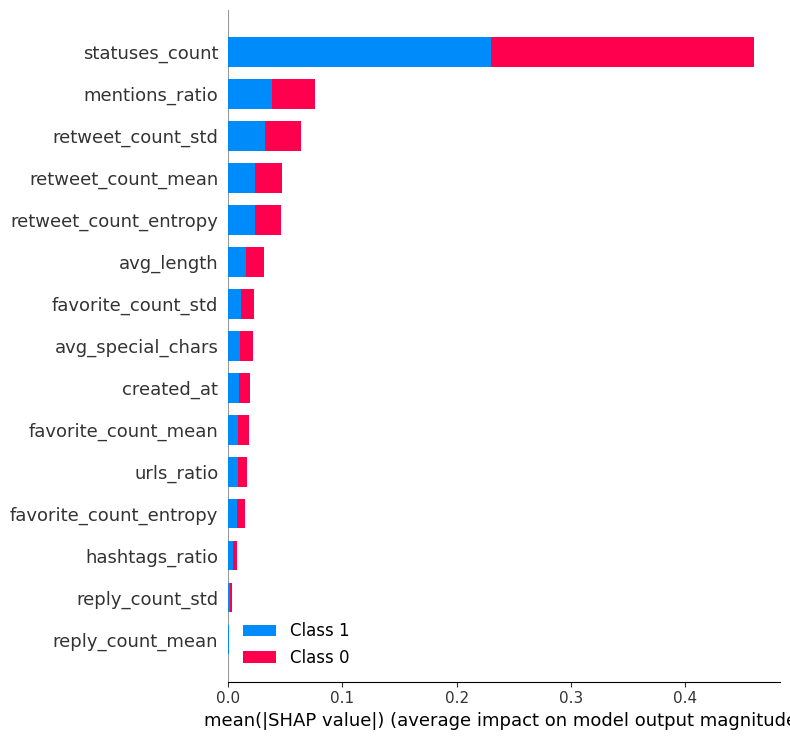

In [8]:
shap.summary_plot(shap_values_tree, test_set.iloc[0:200])

In [9]:
shap_values_tree[0].shape

(200, 15)

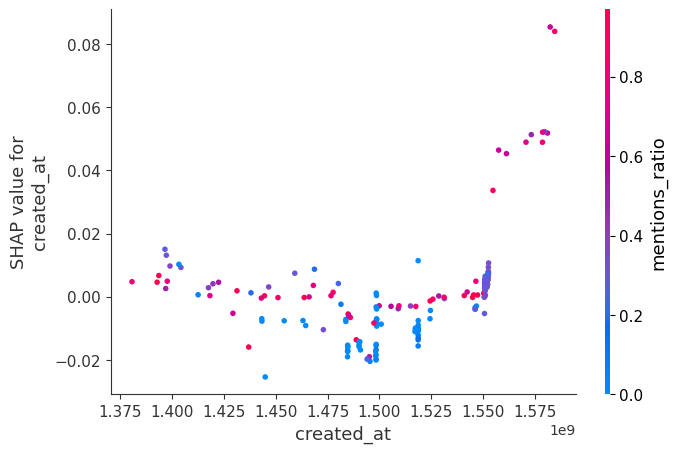

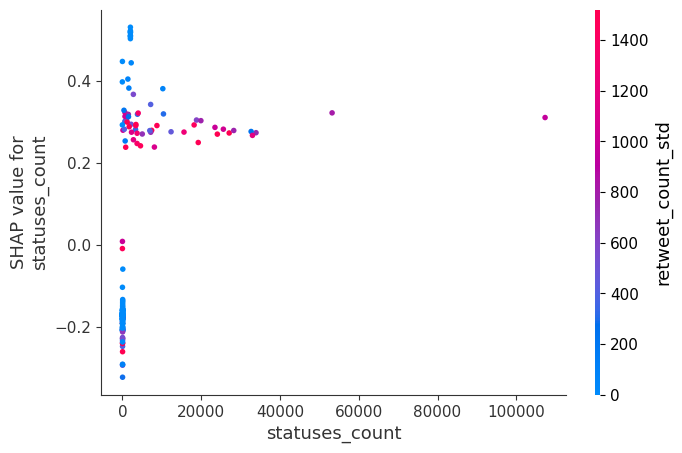

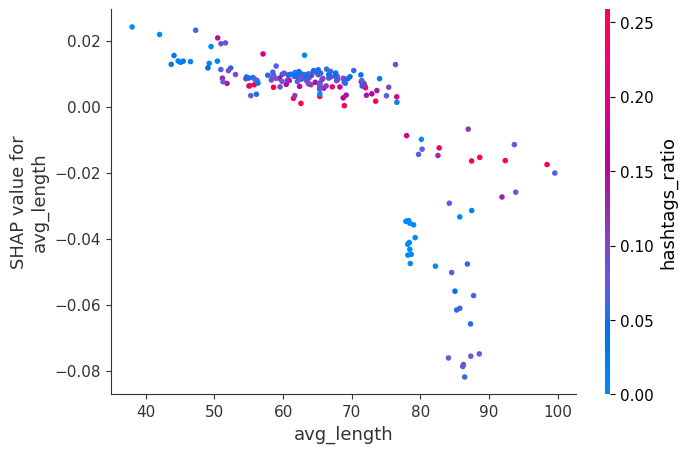

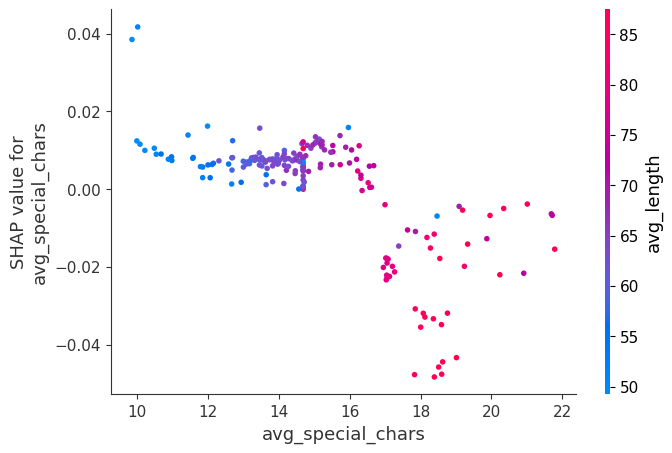

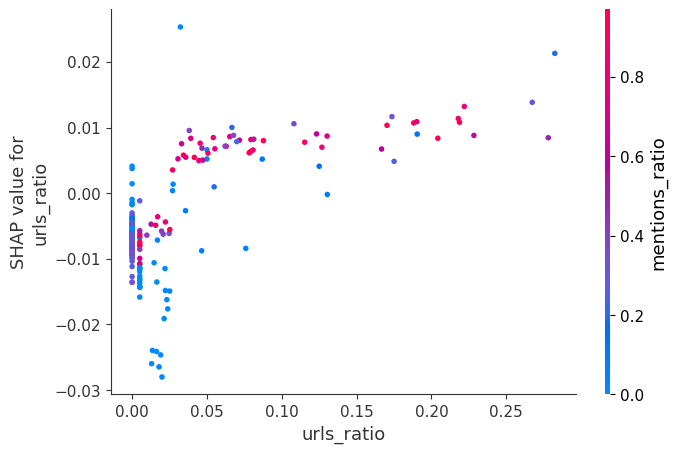

...

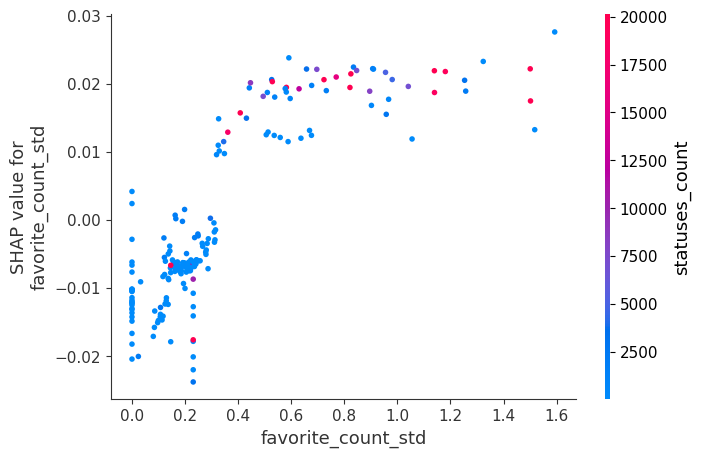

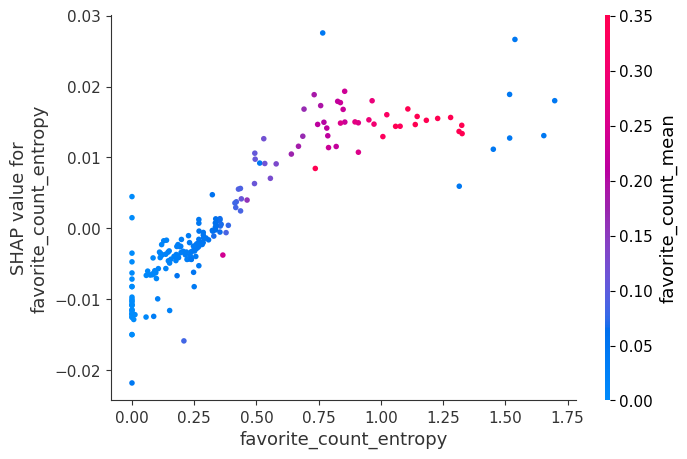

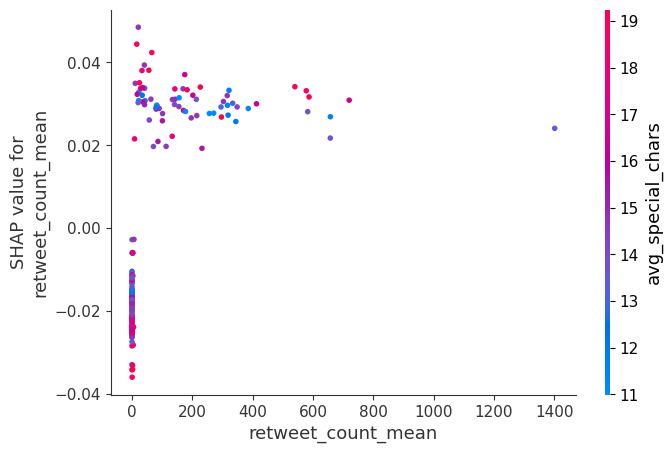

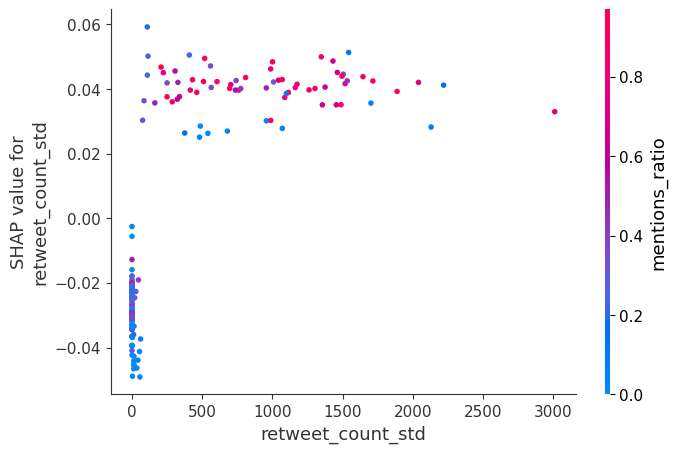

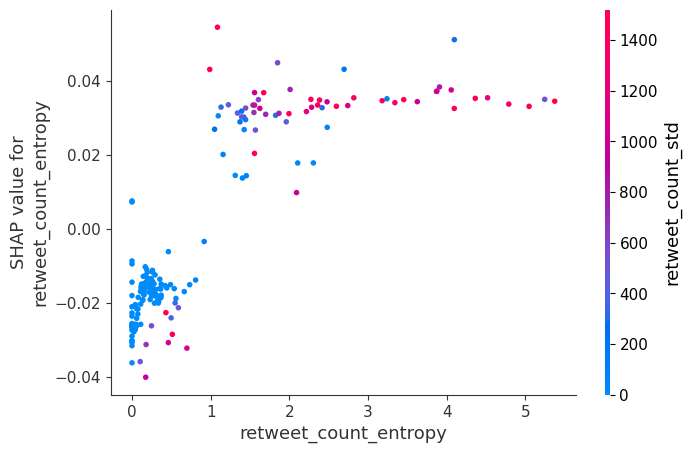

In [10]:
for feat in features:
    shap.dependence_plot(feat, shap_values_tree[0], test_set.iloc[0:200])

In [11]:
shap.initjs()

In [12]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0], test_set.iloc[0:200])

In [13]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1], test_set.iloc[0:200])

In [14]:
shap_interaction_values_tree = shap.TreeExplainer(dt_model).shap_interaction_values(test_set.iloc[0:200])

In [15]:
len(shap_interaction_values_tree)

2

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


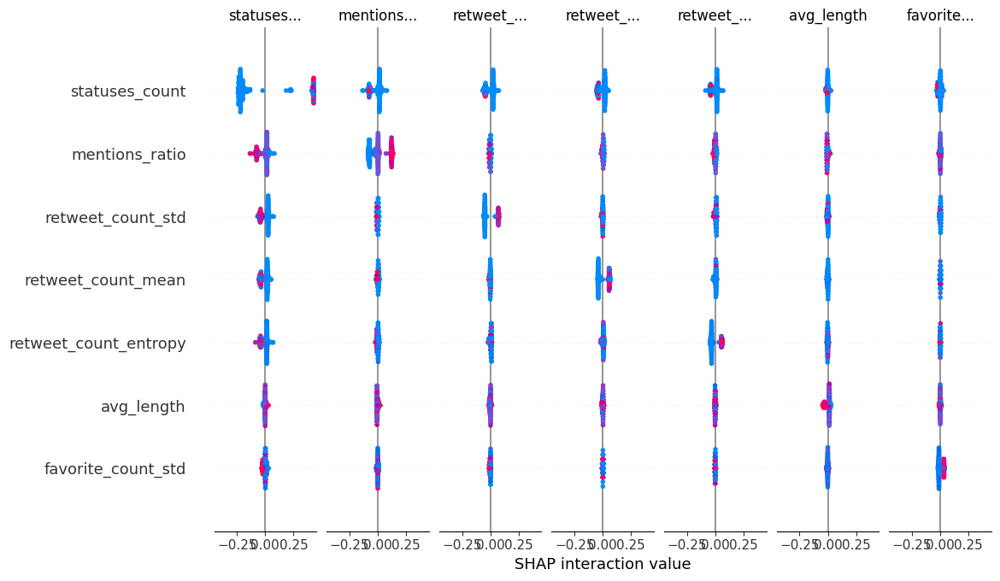

In [16]:
shap.summary_plot(shap_interaction_values_tree[0], test_set.iloc[0:200])

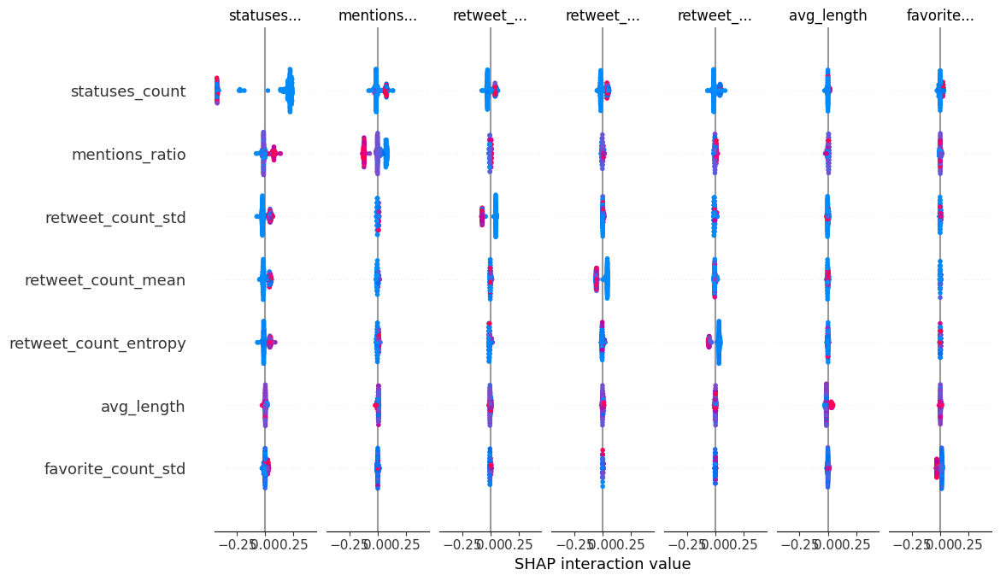

In [17]:
shap.summary_plot(shap_interaction_values_tree[1], test_set.iloc[0:200])

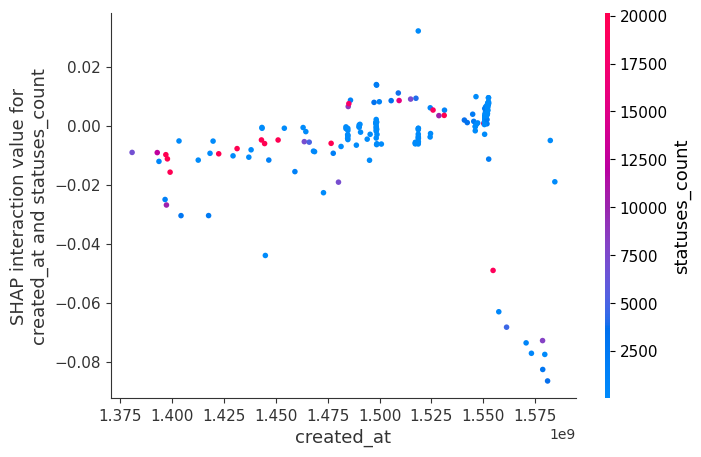

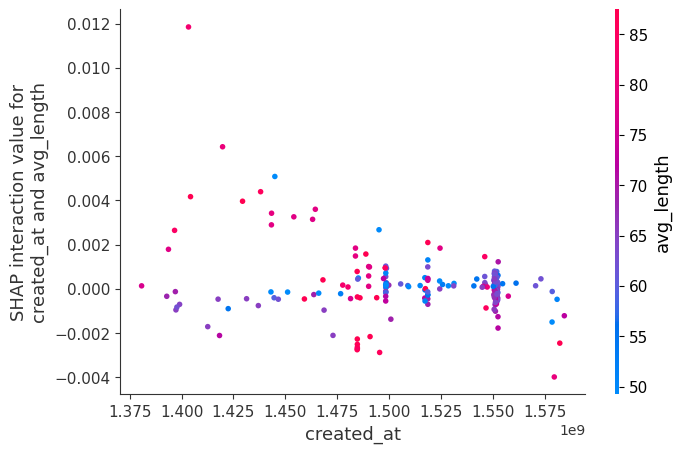

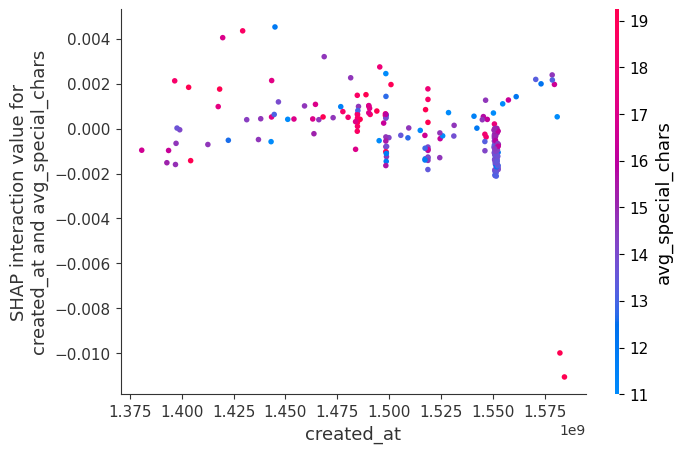

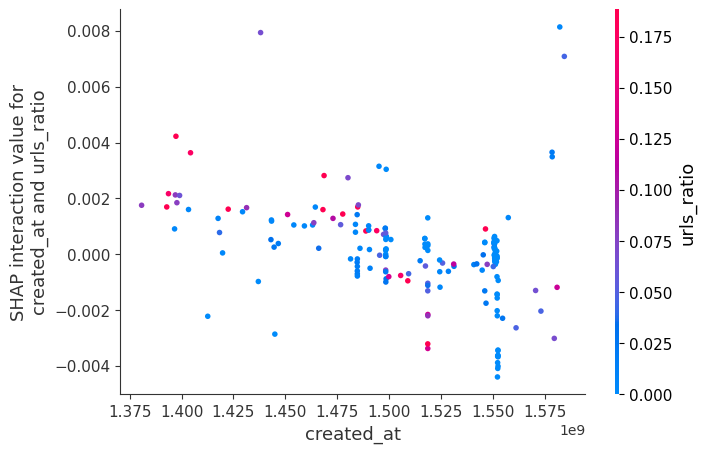

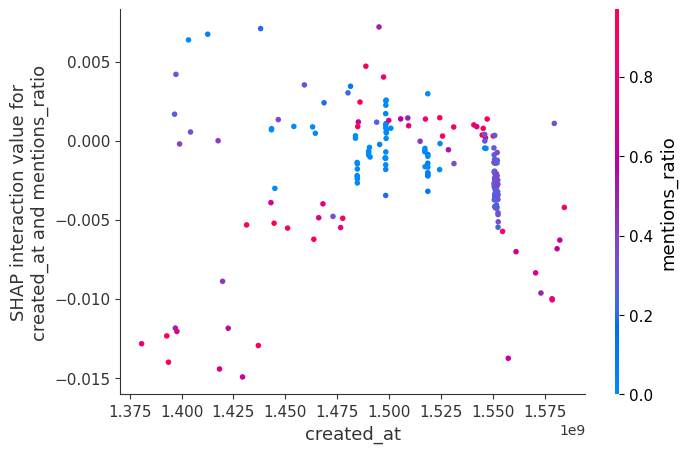

...

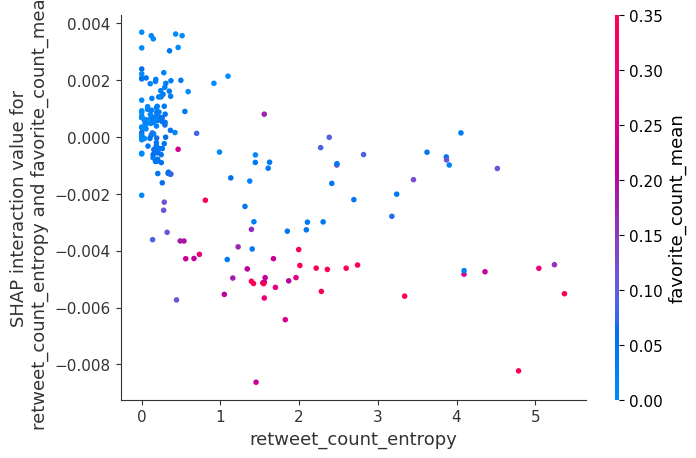

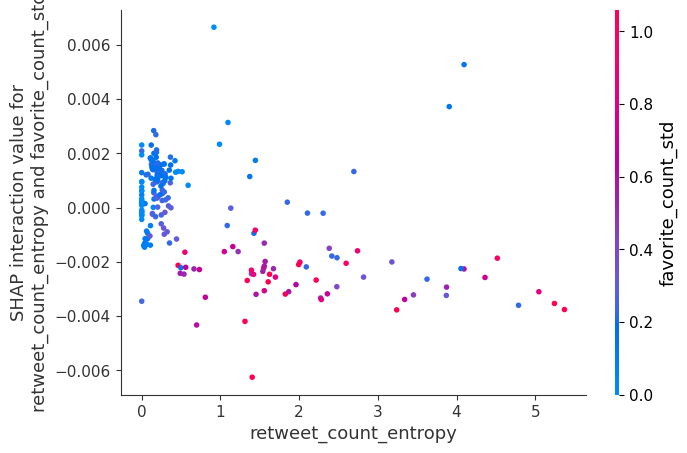

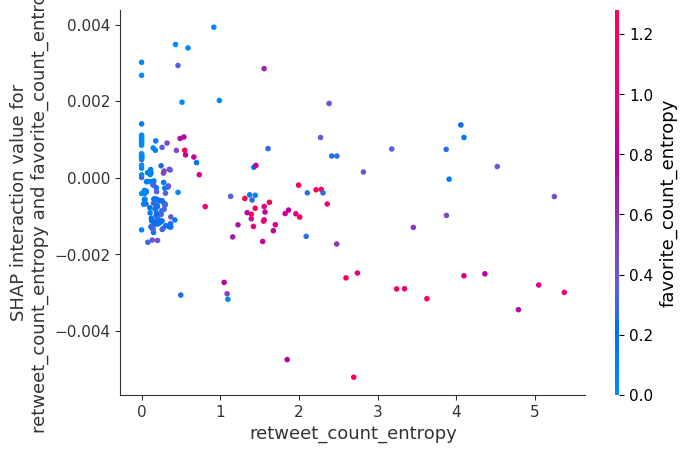

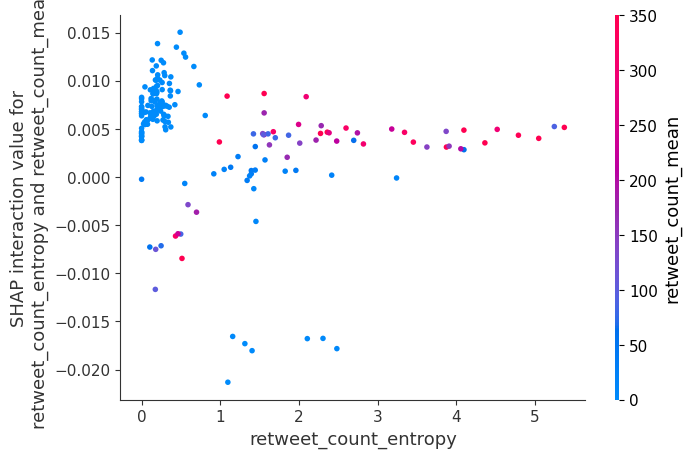

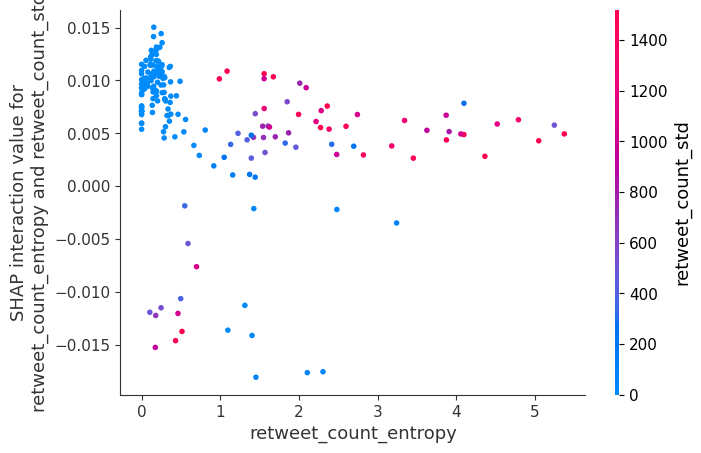

In [18]:
for feat1 in features:
    for feat2 in features:
        if feat1 != feat2:
            shap.dependence_plot(
                (feat1, feat2),
                shap_interaction_values_tree[0], test_set.iloc[0:200]
            )

### Local Explanation

In [19]:
test_set.iloc[1]

created_at                1.581027e+09
statuses_count            3.737000e+03
avg_length                5.114919e+01
avg_special_chars         1.089514e+01
urls_ratio                1.232432e-01
mentions_ratio            6.140541e-01
hashtags_ratio            1.275676e-01
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       9.297297e-02
favorite_count_std        4.312199e-01
favorite_count_entropy    4.276750e-01
retweet_count_mean        2.708238e+02
retweet_count_std         1.375382e+03
retweet_count_entropy     2.382324e+00
Name: 3018833249, dtype: float64

In [20]:
test_label.iloc[1]

0

In [21]:
dt_model.predict(test_set.values[1].reshape(1, -1))

array([0])

In [22]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0][1,:], features)

In [23]:
test_set.iloc[2]

created_at                1.550770e+09
statuses_count            7.600000e+01
avg_length                6.758621e+01
avg_special_chars         1.476552e+01
urls_ratio                0.000000e+00
mentions_ratio            2.896552e-01
hashtags_ratio            4.827586e-02
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       5.517241e-02
favorite_count_std        2.567519e-01
favorite_count_entropy    3.075908e-01
retweet_count_mean        4.137931e-02
retweet_count_std         1.991659e-01
retweet_count_entropy     2.485809e-01
Name: 2352015044, dtype: float64

In [24]:
test_label.iloc[2]

1

In [25]:
dt_model.predict(test_set.values[2].reshape(1, -1))

array([1])

In [26]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1][2,:], features)

## Explain Model: LIME

In [27]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(train_set.values, feature_names = features)

In [44]:
exp = lime_explainer.explain_instance(test_set.values[0], dt_model.predict_proba, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

In [43]:
exp = lime_explainer.explain_instance(test_set.values[1], dt_model.predict_proba, top_labels=0)
exp.show_in_notebook(show_table=True, show_all=True)

## Explain: Evaluation

### Lime

In [30]:
from aix360.metrics import faithfulness_metric, monotonicity_metric

predicted_class = dt_model.predict(test_set.values[0].reshape(1,-1))[0]

le = exp.local_exp[predicted_class]

m = exp.as_map()

x = test_set.values[0]
coefs = np.zeros(x.shape[0])

for v in le:
    coefs[v[0]] = v[1]


base = np.zeros(x.shape[0])


print("Faithfulness: ", faithfulness_metric(dt_model, x, coefs, base))
print("Monotonity: ", monotonicity_metric(dt_model, x, coefs, base))

Faithfulness:  -0.9917863677560728
Monotonity:  False


In [37]:
ncases = 100
fait = np.zeros(ncases)
for i in tqdm(range(ncases)):
    predicted_class = dt_model.predict(test_set.values[i].reshape(1,-1))[0]
    exp = lime_explainer.explain_instance(test_set.values[i], dt_model.predict_proba, top_labels=1)
    le = exp.local_exp[predicted_class]
    m = exp.as_map()
    
    x = test_set.values[i]
    coefs = np.zeros(x.shape[0])
    
    for v in le:
        coefs[v[0]] = v[1]
    fait[i] = faithfulness_metric(dt_model, test_set.values[i], coefs, base)
    
fait[np.isnan(fait)] = 0

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.51it/s]


In [38]:
print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))

Faithfulness metric mean:  0.593102464802988
Faithfulness metric std. dev.: 0.7278631941100224


### Shap

In [39]:
print("Faithfulness: ", faithfulness_metric(dt_model, x, shap_values_tree[predicted_class][0], base))
print("Monotonity: ", monotonicity_metric(dt_model, x, shap_values_tree[predicted_class][0], base))

Faithfulness:  0.8609107346378172
Monotonity:  True


In [40]:
ncases = 100
fait = np.zeros(ncases)
for i in tqdm(range(ncases)):
    predicted_class = dt_model.predict(test_set.values[i].reshape(1,-1))[0]
    fait[i] = faithfulness_metric(dt_model, test_set.values[i], shap_values_tree[predicted_class][i], base)

fait[np.isnan(fait)] = 0

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.27it/s]


In [41]:
print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))

Faithfulness metric mean:  0.9191009397136134
Faithfulness metric std. dev.: 0.1472177436587921
